# Capstone project 
## Submitted by:
## Paras
### https://github.com/paras3849

### Objective

In the competitive mobile phone market companies want
to understand sales data of mobile phones and factors which drive the prices.
The objective is to find out some relation between features of a mobile phone(eg:- RAM,
Internal Memory, etc) and its selling price. In this problem, we do not have to predict the
actual price but a price range indicating how high is the price.

### Data Description


*  **Battery_power** - Total energy a battery can store in one time measured in mAh
*   **Blue** - Has bluetooth or not
*   **Clock_speed** - speed at which microprocessor executes instructions
*   **Dual_sim** - Has dual sim support or not
*   **Fc** - Front Camera mega pixels
*  **Four_g** - Has 4G or not
*  **Int_memory** - Internal Memory in Gigabytes
*   **M_dep** - Mobile Depth in cm
*   **Mobile_wt** - Weight of mobile phone
*   **N_cores** - Number of cores of processor
*   **Pc** - Primary Camera mega pixels
*   **Px_height** - Pixel Resolution Height
*   **Px_width** - Pixel Resolution Width
*   **Ram** - Random Access Memory in Mega 
*   **Touch_screen** - Has touch screen or not
*   **Wifi** - Has wifi or not
*  **Sc_h** - Screen Height of mobile in cm
*   **Sc_w** - Screen Width of mobile in cm
*   **Talk_time** - longest time that a single battery charge will last when you are
*   **Three_g** - Has 3G or not
*   **Wifi** - Has wifi or not
*  **Price_range** - This is the target variable with value of 0(low cost), 1(medium cost),2(high cost) and 3(very high cost).









## Import Libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier  
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, f1_score, precision_score, recall_score
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
from sklearn.model_selection import cross_val_score
from pandas_profiling import ProfileReport
from warnings import filterwarnings

filterwarnings("ignore")

C:\Users\PARAS\AppData\Local\Temp\ipykernel_25528\3665006993.py:16: DeprecationWarning: `import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.
  from pandas_profiling import ProfileReport


## Import the data

In [2]:
df = pd.read_csv('D:\Project Ekeeda\data.csv')

## Data Analysis

In [3]:
df.head()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,842,0,2.2,0,1,0,7,0.6,188,2,...,20,756,2549,9,7,19,0,0,1,1
1,1021,1,0.5,1,0,1,53,0.7,136,3,...,905,1988,2631,17,3,7,1,1,0,2
2,563,1,0.5,1,2,1,41,0.9,145,5,...,1263,1716,2603,11,2,9,1,1,0,2
3,615,1,2.5,0,0,0,10,0.8,131,6,...,1216,1786,2769,16,8,11,1,0,0,2
4,1821,1,1.2,0,13,1,44,0.6,141,2,...,1208,1212,1411,8,2,15,1,1,0,1


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   battery_power  2000 non-null   int64  
 1   blue           2000 non-null   int64  
 2   clock_speed    2000 non-null   float64
 3   dual_sim       2000 non-null   int64  
 4   fc             2000 non-null   int64  
 5   four_g         2000 non-null   int64  
 6   int_memory     2000 non-null   int64  
 7   m_dep          2000 non-null   float64
 8   mobile_wt      2000 non-null   int64  
 9   n_cores        2000 non-null   int64  
 10  pc             2000 non-null   int64  
 11  px_height      2000 non-null   int64  
 12  px_width       2000 non-null   int64  
 13  ram            2000 non-null   int64  
 14  sc_h           2000 non-null   int64  
 15  sc_w           2000 non-null   int64  
 16  talk_time      2000 non-null   int64  
 17  three_g        2000 non-null   int64  
 18  touch_sc

Continuous Features =['battery_power','clock_speed','int_memory','m_dep','mobile_wt','n_cores','px_height','px_width','ram','sc_h','sc_w','talk_time']

binary features = ['blue', 'dual_sim','fc','four_g','three_g','touch_screen','wifi']

classification feature = ['price_range']

In [5]:
df.columns

Index(['battery_power', 'blue', 'clock_speed', 'dual_sim', 'fc', 'four_g',
       'int_memory', 'm_dep', 'mobile_wt', 'n_cores', 'pc', 'px_height',
       'px_width', 'ram', 'sc_h', 'sc_w', 'talk_time', 'three_g',
       'touch_screen', 'wifi', 'price_range'],
      dtype='object')

In [6]:
df.shape

(2000, 21)

In [7]:
df.nunique()

battery_power    1094
blue                2
clock_speed        26
dual_sim            2
fc                 20
four_g              2
int_memory         63
m_dep              10
mobile_wt         121
n_cores             8
pc                 21
px_height        1137
px_width         1109
ram              1562
sc_h               15
sc_w               19
talk_time          19
three_g             2
touch_screen        2
wifi                2
price_range         4
dtype: int64

##### Checking the total numbers of missing Values

In [8]:
df.isnull().sum()

battery_power    0
blue             0
clock_speed      0
dual_sim         0
fc               0
four_g           0
int_memory       0
m_dep            0
mobile_wt        0
n_cores          0
pc               0
px_height        0
px_width         0
ram              0
sc_h             0
sc_w             0
talk_time        0
three_g          0
touch_screen     0
wifi             0
price_range      0
dtype: int64

In [9]:
df.duplicated().sum()

0

We do not have any null values in our dataset. It will ease the preprocessing step.

In [10]:
df.profile_report()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

##### Descriptive Statistics for numerical columns

In [11]:
df.describe()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
count,2000.000000,2000.0000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,...,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000
mean,1238.518500,0.4950,1.522250,0.509500,4.309500,0.521500,32.046500,0.501750,140.249000,4.520500,...,645.108000,1251.515500,2124.213000,12.306500,5.767000,11.011000,0.761500,0.503000,0.507000,1.500000
std,439.418206,0.5001,0.816004,0.500035,4.341444,0.499662,18.145715,0.288416,35.399655,2.287837,...,443.780811,432.199447,1084.732044,4.213245,4.356398,5.463955,0.426273,0.500116,0.500076,1.118314
min,501.000000,0.0000,0.500000,0.000000,0.000000,0.000000,2.000000,0.100000,80.000000,1.000000,...,0.000000,500.000000,256.000000,5.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000
25%,851.750000,0.0000,0.700000,0.000000,1.000000,0.000000,16.000000,0.200000,109.000000,3.000000,...,282.750000,874.750000,1207.500000,9.000000,2.000000,6.000000,1.000000,0.000000,0.000000,0.750000
50%,1226.000000,0.0000,1.500000,1.000000,3.000000,1.000000,32.000000,0.500000,141.000000,4.000000,...,564.000000,1247.000000,2146.500000,12.000000,5.000000,11.000000,1.000000,1.000000,1.000000,1.500000
75%,1615.250000,1.0000,2.200000,1.000000,7.000000,1.000000,48.000000,0.800000,170.000000,7.000000,...,947.250000,1633.000000,3064.500000,16.000000,9.000000,16.000000,1.000000,1.000000,1.000000,2.250000
max,1998.000000,1.0000,3.000000,1.000000,19.000000,1.000000,64.000000,1.000000,200.000000,8.000000,...,1960.000000,1998.000000,3998.000000,19.000000,18.000000,20.000000,1.000000,1.000000,1.000000,3.000000


In [12]:
df['sc_w'][df[df.sc_w == 0].index] = df.sc_w.mean()
df['px_height'][df[df.px_height == 0].index] = df.px_height.mean()

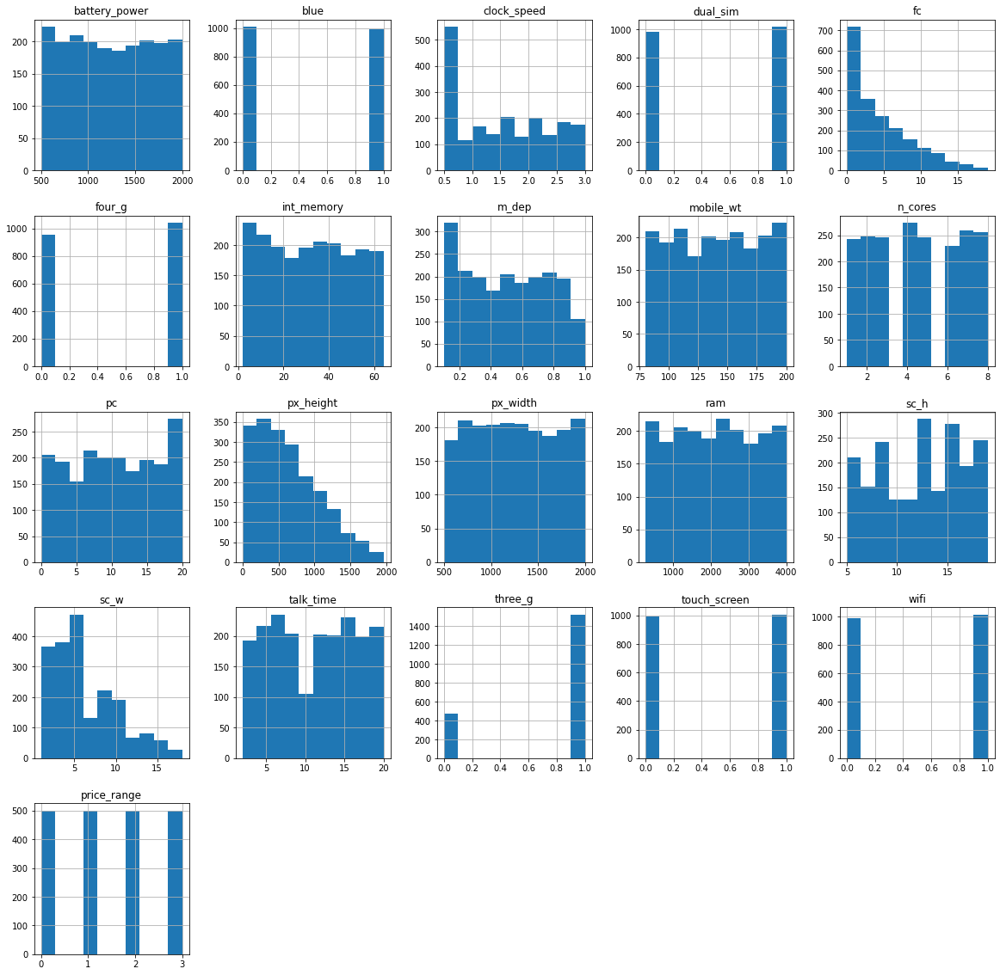

In [13]:
df.hist(figsize=(20,20))
plt.show()

#### Feature Selection

We define our target column as "y" and rest of the data which are used as inputs as "x".

###### Split the dataset into independent (X) and dependent (Y)

In [14]:
x = df.drop('price_range', axis = 1)
x

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi
0,842,0,2.2,0,1,0,7,0.6,188,2,2,20.0,756,2549,9,7.0,19,0,0,1
1,1021,1,0.5,1,0,1,53,0.7,136,3,6,905.0,1988,2631,17,3.0,7,1,1,0
2,563,1,0.5,1,2,1,41,0.9,145,5,6,1263.0,1716,2603,11,2.0,9,1,1,0
3,615,1,2.5,0,0,0,10,0.8,131,6,9,1216.0,1786,2769,16,8.0,11,1,0,0
4,1821,1,1.2,0,13,1,44,0.6,141,2,14,1208.0,1212,1411,8,2.0,15,1,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,794,1,0.5,1,0,1,2,0.8,106,6,14,1222.0,1890,668,13,4.0,19,1,1,0
1996,1965,1,2.6,1,0,0,39,0.2,187,4,3,915.0,1965,2032,11,10.0,16,1,1,1
1997,1911,0,0.9,1,1,1,36,0.7,108,8,3,868.0,1632,3057,9,1.0,5,1,1,0
1998,1512,0,0.9,0,4,1,46,0.1,145,5,5,336.0,670,869,18,10.0,19,1,1,1


In [15]:
y = df['price_range']

In [16]:
y.unique()

array([1, 2, 3, 0], dtype=int64)

## Exploratory Data Analysis

Let's see our dataset is balanced or imbalanced?

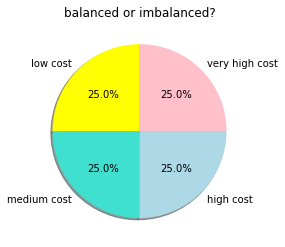

In [17]:
labels = ["low cost", "medium cost", "high cost", "very high cost"]
values = df['price_range'].value_counts().values
colors = ['yellow','turquoise','lightblue', 'pink']
fig1, ax1 = plt.subplots()
ax1.pie(values, labels=labels, colors=colors, autopct='%1.1f%%', shadow=True, startangle=90)
ax1.set_title('balanced or imbalanced?')
plt.show()

###### Battery power

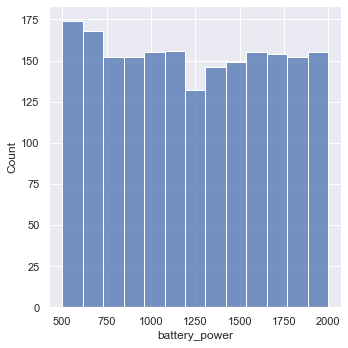

In [18]:
sns.set(rc={'figure.figsize':(5,5)})
ax=sns.displot(df["battery_power"])
plt.show()

###### Bluetooth

<AxesSubplot:xlabel='blue', ylabel='price_range'>

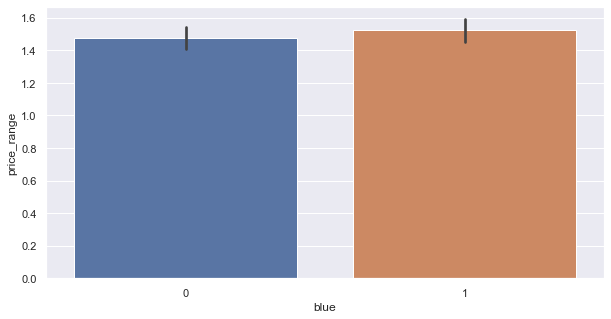

In [19]:
fig,ax=plt.subplots(figsize=(10,5))
sns.barplot(data=df,x='blue',y='price_range',ax=ax)

###### RAM

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.


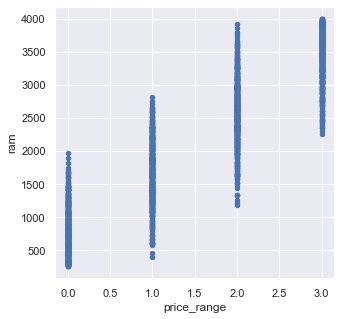

In [20]:
df.plot(x='price_range',y='ram',kind='scatter')
plt.show()

Ram has continuous increase with price range while moving from Low cost to Very high cost

###### Pixel Width and Pixel Height

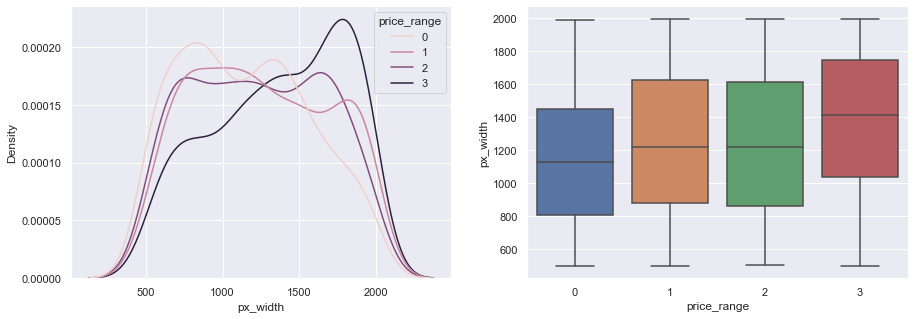

In [21]:
fig, axs = plt.subplots(1,2, figsize=(15,5))
sns.kdeplot(data=df, x='px_width', hue='price_range', ax=axs[0])
sns.boxplot(data=df, x='price_range', y='px_width', ax=axs[1])
plt.show()

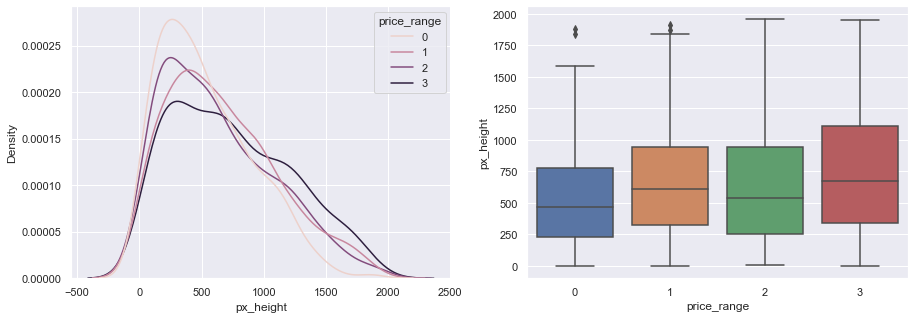

In [22]:
fig, axs = plt.subplots(1,2, figsize=(15,5))
sns.kdeplot(data=df, x='px_height', hue='price_range', ax=axs[0])
sns.boxplot(data=df, x='price_range', y='px_height', ax=axs[1])
plt.show()

###### Front Camera MP

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.


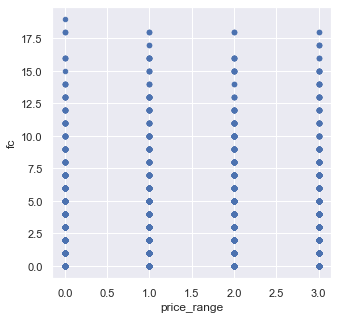

In [23]:
df.plot(x='price_range',y='fc',kind='scatter')
plt.show()

###### n_cores

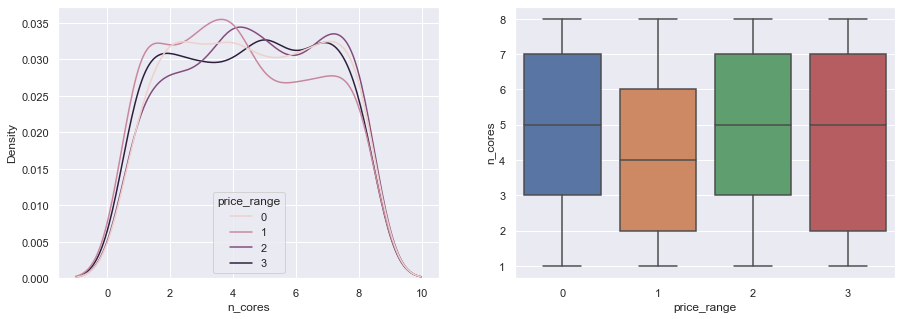

In [24]:
fig, axs = plt.subplots(1,2, figsize=(15,5))
sns.kdeplot(data=df, x='n_cores', hue='price_range', ax=axs[0])
sns.boxplot(data=df, x='price_range', y='n_cores', ax=axs[1])
plt.show()

###### Mobile Weight

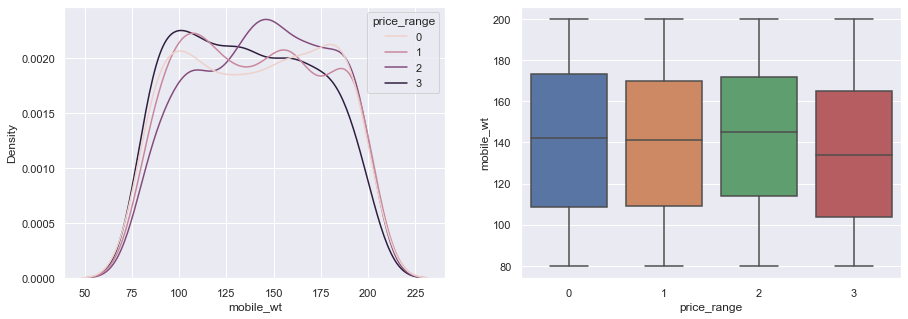

In [25]:
fig, axs = plt.subplots(1,2, figsize=(15,5))
sns.kdeplot(data=df, x='mobile_wt', hue='price_range', ax=axs[0])
sns.boxplot(data=df, x='price_range', y='mobile_wt', ax=axs[1])
plt.show()

###### Spliting Dataset into training and testing samples

In [26]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.3, random_state = 101, stratify = y)

In [27]:
print(x_train.shape)
print(x_test.shape)

(1400, 20)
(600, 20)


## Correlation btw features and target variable

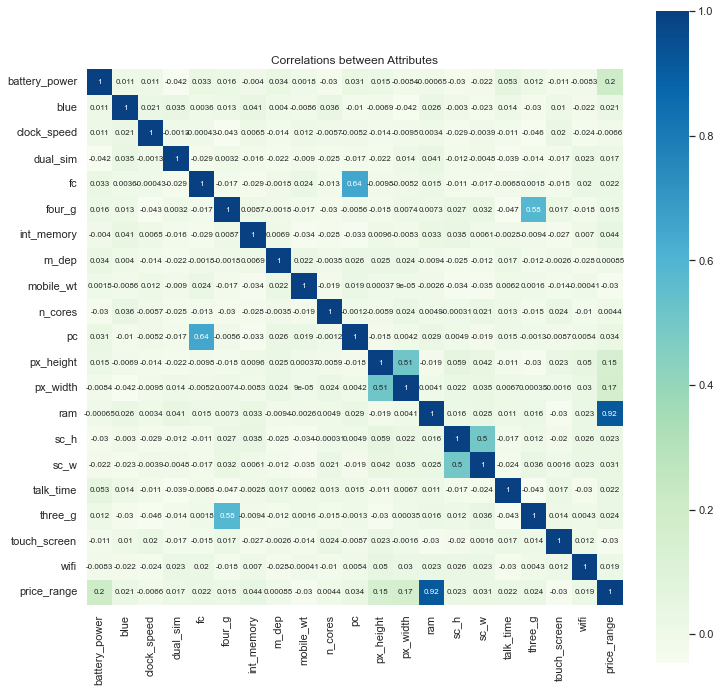

In [28]:
fig = plt.subplots (figsize = (12, 12))
sns.heatmap(df.corr (), square = True, cbar = True, annot = True, cmap="GnBu", annot_kws = {'size': 8})
plt.title('Correlations between Attributes')
plt.show ()

We see from the heatmap that most influential variable is ram.

Most of the variables have very little correlation to price range.

Primary camera mega pixels and front Camera mega pixels have correlation (it make sense because both of them reflect technology 
level of resolution of the related phone model) but they do not effect prige range.

Having 3G and 4G is somewhat correlated.

There is no highly correlated inputs in our dataset, so there is no multicollinearity problem.

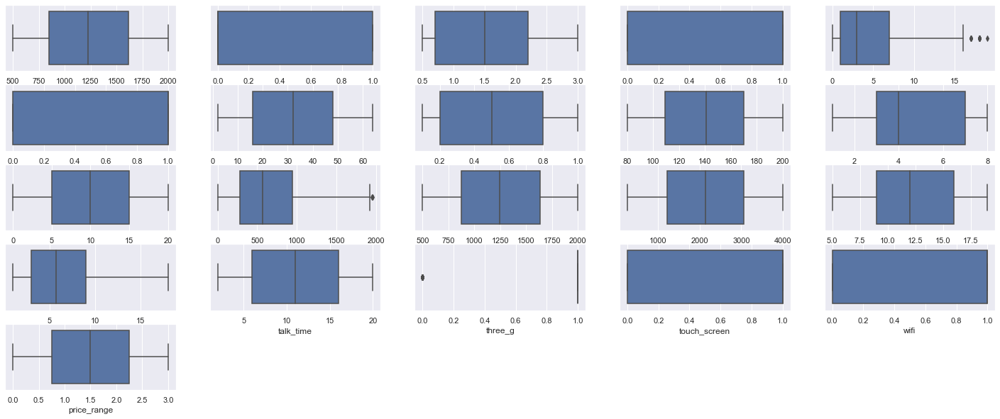

In [29]:
# looking for outliers using box plot
plt.figure(figsize=(25,10))
for index,item in enumerate([i for i in df.describe().columns.to_list()] ):
  plt.subplot(5,5,index+1)
  sns.boxplot(df[item])
print("\n")

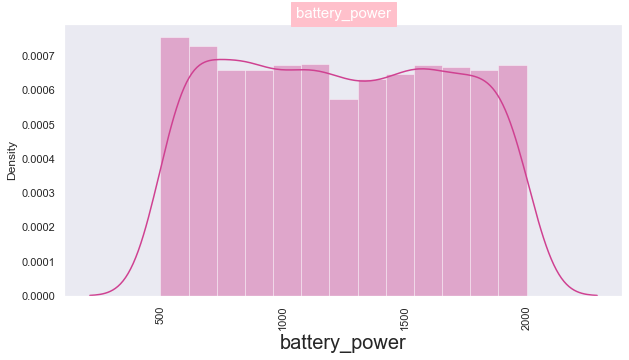

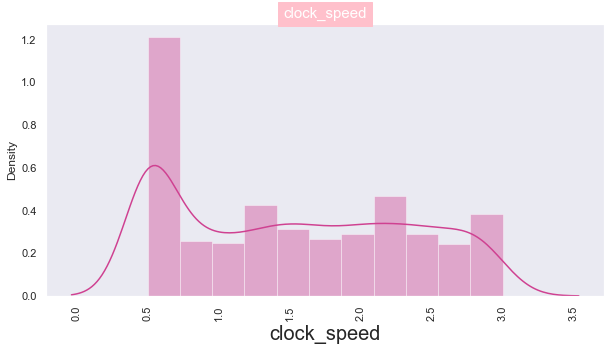

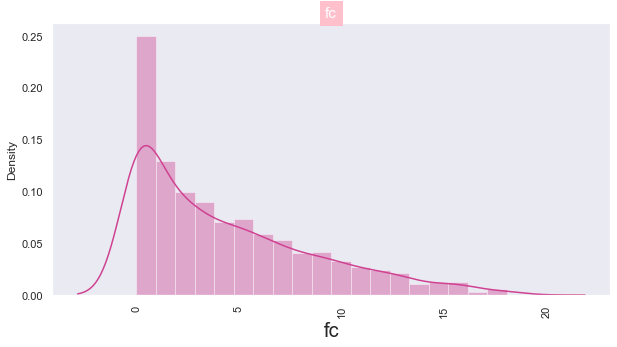

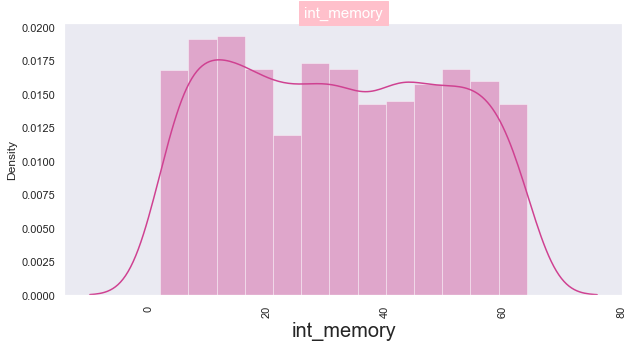

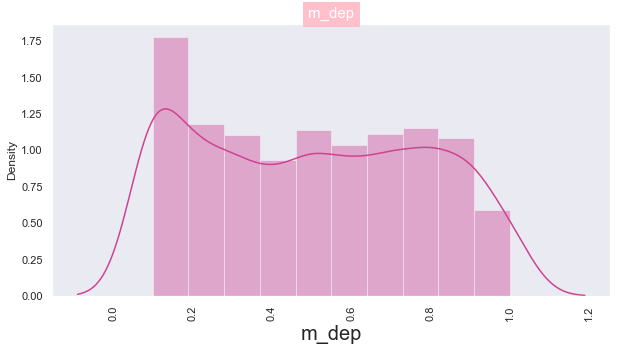

...

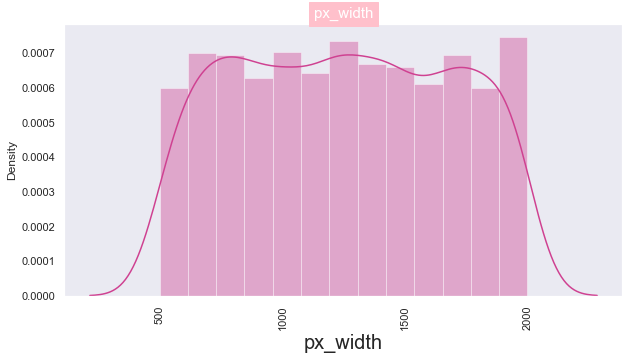

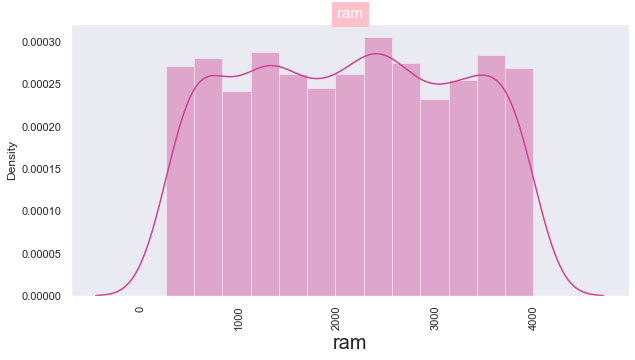

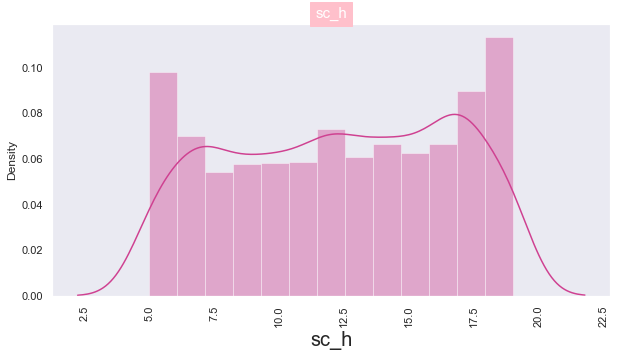

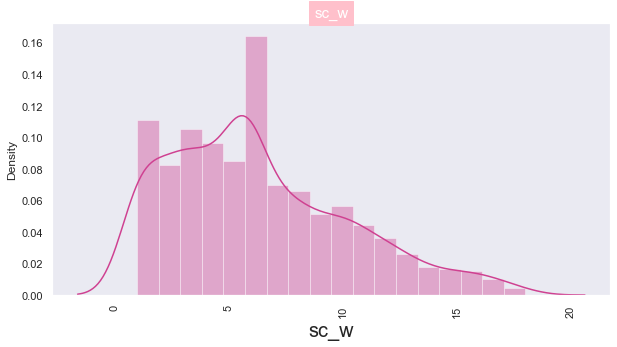

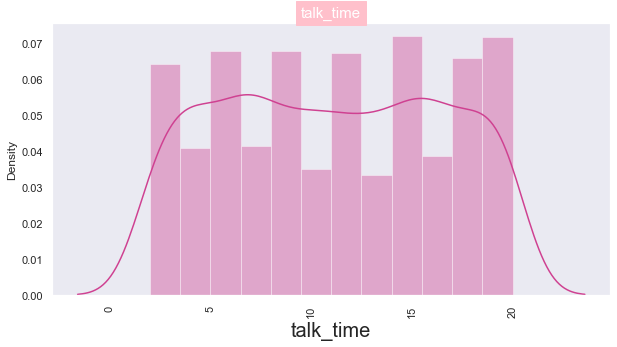

In [30]:
continious = ['battery_power','clock_speed','fc','int_memory','m_dep','mobile_wt','n_cores','px_height','px_width','ram','sc_h','sc_w','talk_time']
sns.set_palette("PiYG")
for column in continious : 
    plt.figure(figsize=(10,5))
    sns.distplot(df, x=df[column])
    plt.title(column,backgroundcolor='pink',color='white',fontsize=15)
    plt.xticks(rotation=90)
    plt.xlabel(column,fontsize=20)
    plt.grid()
    plt.show()

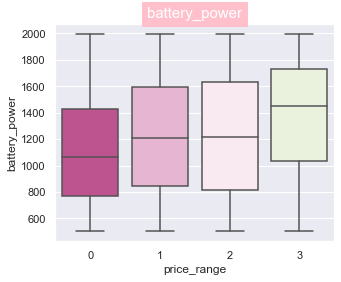

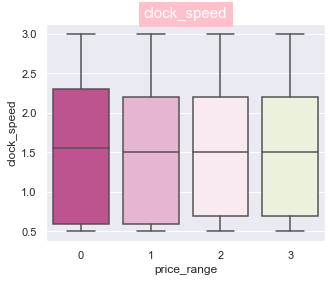

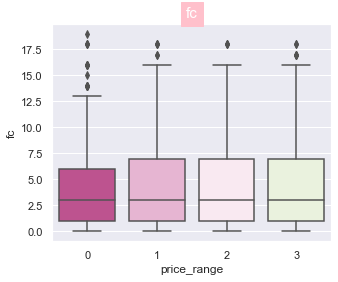

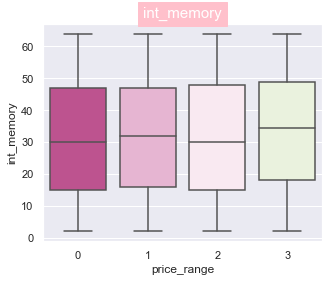

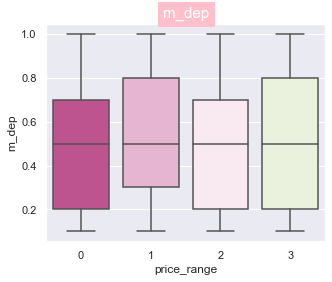

...

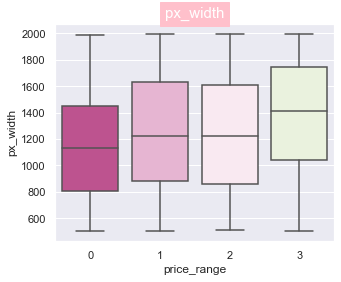

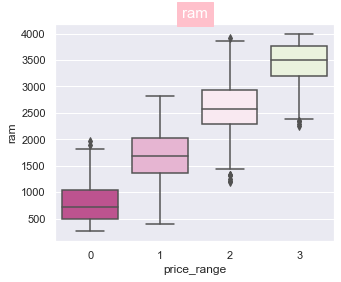

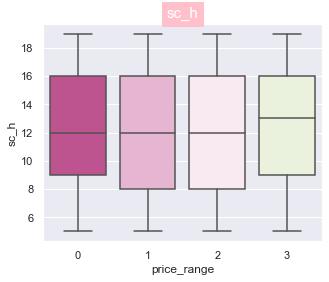

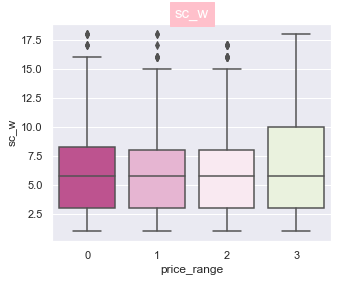

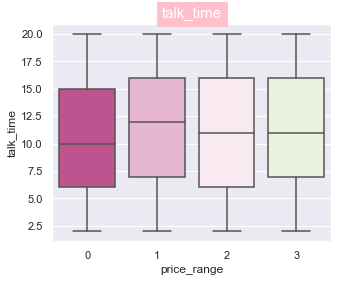

In [31]:
numerical = ['battery_power','clock_speed','fc','int_memory','m_dep','mobile_wt','n_cores','px_height','px_width','ram','sc_h','sc_w','talk_time']
i = 0
sns.set_palette("PiYG")
while i < 13:
    fig = plt.figure(figsize=(5,4))
    sns.boxplot( data= df,x='price_range' ,y=numerical[i] )
    plt.title(numerical[i],backgroundcolor='pink',color='white',fontsize=15)
    i += 1
   
    plt.show()

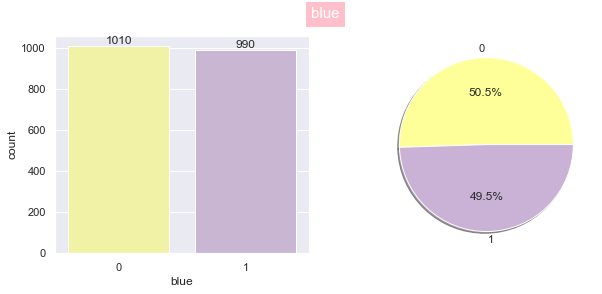

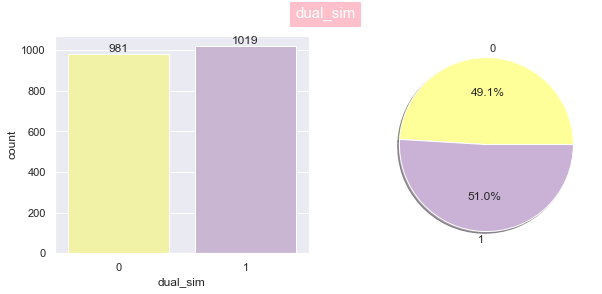

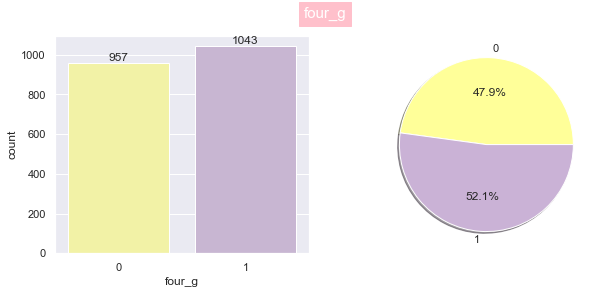

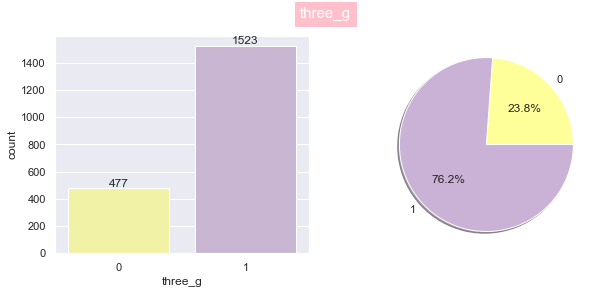

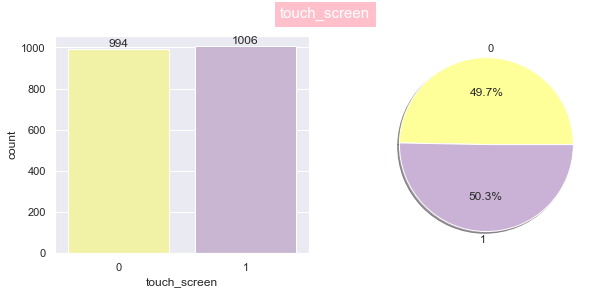

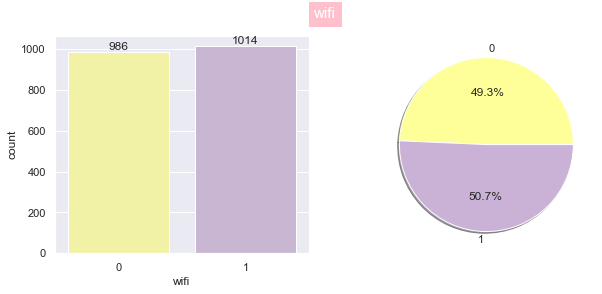

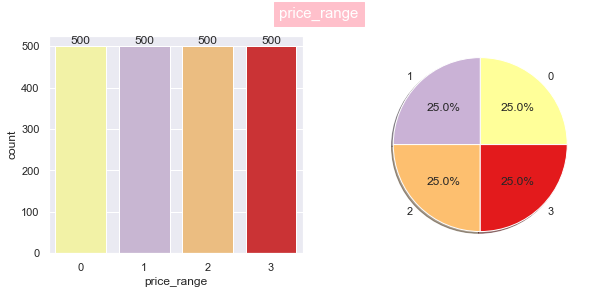

In [32]:
classification= ['blue', 'dual_sim','four_g','three_g','touch_screen','wifi','price_range']
sns.set_palette("Paired_r")
for i, col in enumerate(classification):

    fig, axes = plt.subplots(1,2,figsize=(10,4))

    sns.countplot(data=df, x=col, ax=axes[0])
    for container in axes[0].containers:
        axes[0].bar_label(container)
    slices = df[col].value_counts().sort_index().values
    activities = [var for var in df[col].value_counts().sort_index().index]
    axes[1].pie(slices, labels=activities, shadow=True, autopct='%1.1f%%')
    plt.suptitle(col,backgroundcolor='pink',color='white',fontsize=15)
    plt.show()

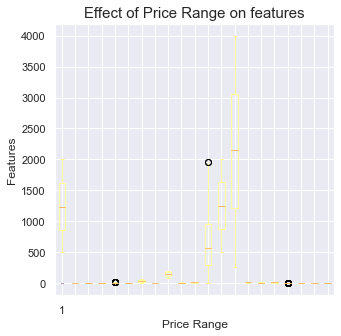

In [33]:
df.plot.box()

plt.boxplot(df['price_range'])
plt.xlabel('Price Range')
plt.ylabel('Features')
plt.title ('Effect of Price Range on features', fontsize = 15)
plt.show()

## Implementation of ML Algorithms

To predict the mobile phone prices, we are going to apply below algorithms respectively on the training and validation dataset. After that, we are going to choose the best model for our data set and create target values for test dataset.

#### Create a generalized function to calculate the performance metrics for the test set.

In [34]:
def get_test_report(model):
    
    y_pred = model.predict(x_test)

    return(classification_report(y_test, y_pred))

#### Define a function to plot the confusion matrix.

In [35]:
def plot_confusion_matrix(model):
    
    y_pred = model.predict(x_test)
    
    cm = confusion_matrix(y_test, y_pred)

    sns.heatmap(cm, annot = True, fmt = 'd', cmap = ListedColormap(['lightskyblue']), cbar = False, linewidths = 0.1, annot_kws = {'size':25})

    plt.xticks(fontsize = 20)

    plt.yticks(fontsize = 20)

    plt.ylabel('Actal Values')

    plt.xlabel('Predicted Values')
    
    plt.show()

### Logistic Regression

Target variables of the data set are discrete, hence, we are going to apply multiclass logistic regression model.

In [36]:
lr = LogisticRegression(multi_class = 'multinomial', solver = 'sag',  max_iter = 10000)
lr.fit(x_train, y_train)

LogisticRegression(max_iter=10000, multi_class='multinomial', solver='sag')

In [37]:
y_pred_lr = lr.predict(x_test)

In [38]:
print("Training accuracy :", lr.score(x_train, y_train))
print("Testing accuarcy :", lr.score(x_test, y_test))

Training accuracy : 0.695
Testing accuarcy : 0.72


In [39]:
acc_lr = accuracy_score(y_test, y_pred_lr)

In [40]:
print('Accuracy of Logistic Regression model is {}'.format(accuracy_score(y_test,y_pred_lr)*100))

Accuracy of Logistic Regression model is 72.0


In [41]:
lr_model=lr.fit(x_train,y_train)

In [42]:
print('Confusion matrix : ')
lr_cm = confusion_matrix(y_test, y_pred_lr)
print(lr_cm)

Confusion matrix : 
[[128  22   0   0]
 [ 12  97  37   4]
 [  1  24  84  41]
 [  0   1  26 123]]


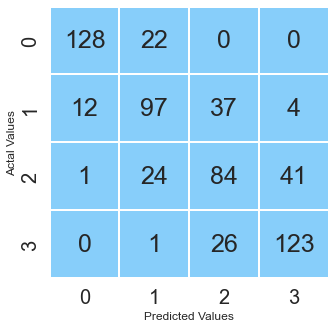

In [43]:
plot_confusion_matrix(lr_model)

In [44]:
print("Classification Report")
test_report = get_test_report(lr_model)

print(test_report)

Classification Report
              precision    recall  f1-score   support

           0       0.91      0.85      0.88       150
           1       0.67      0.65      0.66       150
           2       0.57      0.56      0.57       150
           3       0.73      0.82      0.77       150

    accuracy                           0.72       600
   macro avg       0.72      0.72      0.72       600
weighted avg       0.72      0.72      0.72       600



In [45]:
result = pd.DataFrame([['Logistic Regression', acc_lr]], columns = ['Model', 'Accuracy'])
result

,Model,Accuracy
0,Logistic Regression,0.72


In [46]:
#cross-validation

acc= cross_val_score(estimator=lr, X=x_train, y=y_train, cv=10)
print("Accuracy is {:.2f}%.".format(acc.mean()*100))
print("Standard Deviation is {:.2f}%.".format(acc.std()*100))

Accuracy is 68.07%.
Standard Deviation is 2.65%.


### Decision Tree

Decision tree is one of the most popular supervised learning algorithm that is mostly used in classification problems.

In [47]:
dt = DecisionTreeClassifier(random_state=1)
dt_model = dt.fit(x_train, y_train)

In [48]:
y_pred_dt = dt.predict(x_test)

In [49]:
dt_model

DecisionTreeClassifier(random_state=1)

In [50]:
print("Training accuracy :", dt.score(x_train, y_train))
print("Testing accuarcy :", dt.score(x_test, y_test))

Training accuracy : 1.0
Testing accuarcy : 0.8533333333333334


In [51]:
acc_dt = accuracy_score(y_test, y_pred_dt)

In [52]:
print('Accuracy of Decision Tree Classifier model is {}'.format(accuracy_score(y_test,y_pred_dt)*100))

Accuracy of Decision Tree Classifier model is 85.33333333333334


In [53]:
print('Confusion matrix : ')
print(confusion_matrix(y_test, y_pred_dt))

Confusion matrix : 
[[141   9   0   0]
 [ 13 121  16   0]
 [  0  18 112  20]
 [  0   0  12 138]]


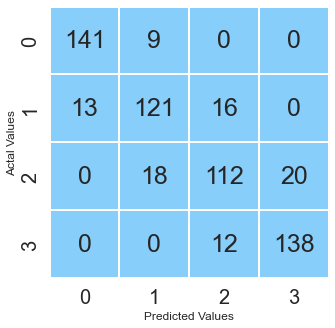

In [54]:
plot_confusion_matrix(dt_model)

In [55]:
print("Classification Report")
test_report = get_test_report(dt_model)

print(test_report)

Classification Report
              precision    recall  f1-score   support

           0       0.92      0.94      0.93       150
           1       0.82      0.81      0.81       150
           2       0.80      0.75      0.77       150
           3       0.87      0.92      0.90       150

    accuracy                           0.85       600
   macro avg       0.85      0.85      0.85       600
weighted avg       0.85      0.85      0.85       600



In [56]:
result1 = pd.DataFrame([['Decision Tree Classifier', acc_dt]], columns = ['Model', 'Accuracy'])
result1

,Model,Accuracy
0,Decision Tree Classifier,0.853333


In [57]:
result = result.append(result1, ignore_index=True)
result

,Model,Accuracy
0,Logistic Regression,0.720000
1,Decision Tree Classifier,0.853333


In [58]:
#cross-validation

acc= cross_val_score(estimator=dt, X=x_train, y=y_train, cv=10)
print("Accuracy is {:.2f}%.".format(acc.mean()*100))
print("Standard Deviation is {:.2f}%.".format(acc.std()*100))

Accuracy is 80.21%.
Standard Deviation is 2.86%.


### Random Forest

Random forest is a type of ensemble method of machine learning. It deals with overfitting problem and increase accuracy compared to a simple decision tree model.

In [59]:
rf = RandomForestClassifier(n_estimators = 100, random_state=101, criterion = 'entropy', oob_score = True) 
rf_model = rf.fit(x_train, y_train)

In [60]:
y_pred_rf = rf.predict(x_test) 

In [61]:
print("Training accuracy :", rf.score(x_train, y_train))
print("Testing accuarcy :", rf.score(x_test, y_test))

Training accuracy : 1.0
Testing accuarcy : 0.9


In [62]:
acc_rf = accuracy_score(y_test, y_pred_rf)

In [63]:
print('Accuracy of Random Forest Classifier model is {}'.format(accuracy_score(y_test,y_pred_rf)*100))

Accuracy of Random Forest Classifier model is 90.0


In [64]:
print('Confusion matrix : ')
print(metrics.confusion_matrix(y_test, y_pred_rf)) 

Confusion matrix : 
[[142   8   0   0]
 [  4 135  11   0]
 [  0  21 120   9]
 [  0   0   7 143]]


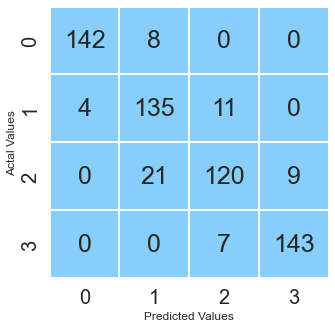

In [65]:
plot_confusion_matrix(rf_model)

In [66]:
print("Classification Report")
test_report = get_test_report(rf_model)

print(test_report)

Classification Report
              precision    recall  f1-score   support

           0       0.97      0.95      0.96       150
           1       0.82      0.90      0.86       150
           2       0.87      0.80      0.83       150
           3       0.94      0.95      0.95       150

    accuracy                           0.90       600
   macro avg       0.90      0.90      0.90       600
weighted avg       0.90      0.90      0.90       600



We see that accuracy score in random forest model is higher than decision tree accuracy score.

In [67]:
result1 = pd.DataFrame([['Random Forest Classifier', acc_rf]], columns = ['Model', 'Accuracy'])
result1

,Model,Accuracy
0,Random Forest Classifier,0.9


In [68]:
result = result.append(result1, ignore_index=True)
result

,Model,Accuracy
0,Logistic Regression,0.720000
1,Decision Tree Classifier,0.853333
2,Random Forest Classifier,0.900000


In [69]:
#cross-validation

acc= cross_val_score(estimator=rf, X=x_train, y=y_train, cv=10)
print("Accuracy is {:.2f}%.".format(acc.mean()*100))
print("Standard Deviation is {:.2f}%.".format(acc.std()*100))

Accuracy is 87.79%.
Standard Deviation is 3.02%.


### K-Nearest Neighbors (KNN)

'K' is the number of nearest training points which we classify them using the majority vote.

In [70]:
knn = KNeighborsClassifier(n_neighbors=3)  
knn_model=knn.fit(x_train, y_train)

In [71]:
y_pred_knn = knn.predict(x_test)  

In [72]:
print("Training accuracy :", knn.score(x_train, y_train))
print("Testing accuarcy :", knn.score(x_test, y_test))

Training accuracy : 0.9585714285714285
Testing accuarcy : 0.9283333333333333


In [73]:
acc_knn = accuracy_score(y_test, y_pred_knn)

In [74]:
print('Accuracy of KNN Classifier model is {}'.format(accuracy_score(y_test,y_pred_knn)*100))

Accuracy of KNN Classifier model is 92.83333333333333


In [75]:
print('Confusion matrix : ')
print(metrics.confusion_matrix(y_test, y_pred_knn))

Confusion matrix : 
[[142   8   0   0]
 [  6 139   5   0]
 [  0   8 136   6]
 [  0   0  10 140]]


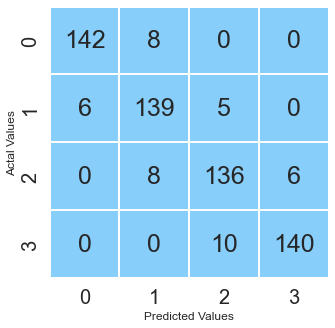

In [76]:
plot_confusion_matrix(knn_model)

Let's find the optimum 'k' value via Grid Search method and run knn model with this 'k'.

In [77]:
from sklearn.model_selection import GridSearchCV
parameters = {'n_neighbors':np.arange(1,30)}
knn = KNeighborsClassifier()

model = GridSearchCV(knn, parameters, cv=5)
model.fit(x_train, y_train)
model.best_params_

{'n_neighbors': 23}

After finding optimum k number, we run our model again with k=23.

In [78]:
Knn = KNeighborsClassifier(n_neighbors=23)  
knn_model = knn.fit(x_train, y_train)  

In [79]:
y_pred_knn = knn.predict(x_test) 

In [80]:
print("Training accuracy :", knn.score(x_train, y_train))
print("Testing accuarcy :", knn.score(x_test, y_test))

Training accuracy : 0.945
Testing accuarcy : 0.9416666666666667


In [81]:
acc_knn = accuracy_score(y_test, y_pred_knn)

In [82]:
print('Accuracy of KNN Classifier model is {}'.format(accuracy_score(y_test,y_pred_knn)*100))

Accuracy of KNN Classifier model is 94.16666666666667


In [83]:
print('Confusion matrix : ')
print(metrics.confusion_matrix(y_test, y_pred_knn)) 

Confusion matrix : 
[[144   6   0   0]
 [  4 139   7   0]
 [  0   6 141   3]
 [  0   0   9 141]]


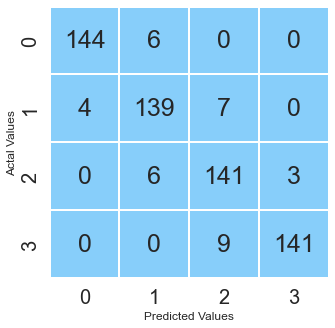

In [84]:
plot_confusion_matrix(knn_model)

In [85]:
print("Classification Report")
test_report = get_test_report(knn_model)

print(test_report)

Classification Report
              precision    recall  f1-score   support

           0       0.97      0.96      0.97       150
           1       0.92      0.93      0.92       150
           2       0.90      0.94      0.92       150
           3       0.98      0.94      0.96       150

    accuracy                           0.94       600
   macro avg       0.94      0.94      0.94       600
weighted avg       0.94      0.94      0.94       600



In [86]:
result1 = pd.DataFrame([['KNN Classifier', acc_knn]], columns = ['Model', 'Accuracy'])
result1

,Model,Accuracy
0,KNN Classifier,0.941667


In [87]:
result = result.append(result1, ignore_index=True)
result

,Model,Accuracy
0,Logistic Regression,0.720000
1,Decision Tree Classifier,0.853333
2,Random Forest Classifier,0.900000
3,KNN Classifier,0.941667


In [88]:
#cross-validation

acc= cross_val_score(estimator=knn, X=x_train, y=y_train, cv=10)
print("Accuracy is {:.2f}%.".format(acc.mean()*100))
print("Standard Deviation is {:.2f}%.".format(acc.std()*100))

Accuracy is 91.79%.
Standard Deviation is 2.60%.


### SVM Classifier

The SVM algorithm's purpose is to find the optimum line or decision boundary for categorising n-dimensional space so that we may simply place fresh data points in the proper category in the future. 

In [89]:
from sklearn import svm
svm = svm.SVC(decision_function_shape='ovo')
svm_model =svm.fit(x_train, y_train)

In [90]:
y_pred_svm=svm.predict(x_test)

In [91]:
print("Training accuracy :", svm.score(x_train, y_train))
print("Testing accuarcy :", svm.score(x_test, y_test))

Training accuracy : 0.9514285714285714
Testing accuarcy : 0.9383333333333334


In [92]:
acc_svm = accuracy_score(y_test, y_pred_svm)

In [93]:
print('Accuracy of SVM Classifier model is {}'.format(accuracy_score(y_test,y_pred_svm)*100))

Accuracy of SVM Classifier model is 93.83333333333333


In [94]:
print('Confusion matrix : ')
print(metrics.confusion_matrix(y_test, y_pred_svm)) 

Confusion matrix : 
[[142   8   0   0]
 [  3 142   5   0]
 [  0   9 137   4]
 [  0   0   8 142]]


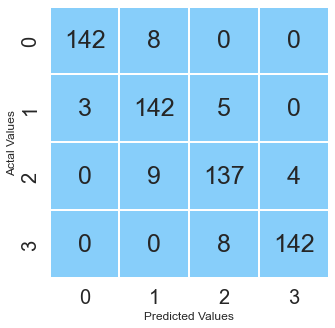

In [95]:
plot_confusion_matrix(svm_model)

In [96]:
print("Classification Report")
test_report = get_test_report(svm_model)

print(test_report)

Classification Report
              precision    recall  f1-score   support

           0       0.98      0.95      0.96       150
           1       0.89      0.95      0.92       150
           2       0.91      0.91      0.91       150
           3       0.97      0.95      0.96       150

    accuracy                           0.94       600
   macro avg       0.94      0.94      0.94       600
weighted avg       0.94      0.94      0.94       600



In [97]:
result1 = pd.DataFrame([['SVM Classifier', acc_svm]], columns = ['Model', 'Accuracy'])
result1

,Model,Accuracy
0,SVM Classifier,0.938333


In [98]:
result = result.append(result1, ignore_index=True)
result

,Model,Accuracy
0,Logistic Regression,0.720000
1,Decision Tree Classifier,0.853333
2,Random Forest Classifier,0.900000
3,KNN Classifier,0.941667
4,SVM Classifier,0.938333


In [99]:
#cross-validation

acc= cross_val_score(estimator=svm, X=x_train, y=y_train, cv=10)
print("Accuracy is {:.2f}%.".format(acc.mean()*100))
print("Standard Deviation is {:.2f}%.".format(acc.std()*100))

Accuracy is 94.86%.
Standard Deviation is 2.23%.


### Naive Bayes

Conditional probability is the foundation of Bayes’ theorem. The conditional probability aids us in assessing the likelihood of something occurring if something else has previously occurred.

In [100]:
from sklearn.naive_bayes import GaussianNB
gn = GaussianNB()
gn_model = gn.fit(x_train, y_train)

In [101]:
y_pred_gn=gn.predict(x_test)

In [102]:
print("Training accuracy :", gn.score(x_train, y_train))
print("Testing accuarcy :", gn.score(x_test, y_test))

Training accuracy : 0.8207142857142857
Testing accuarcy : 0.8133333333333334


In [103]:
acc_gn = accuracy_score(y_test, y_pred_gn)

In [104]:
print('Accuracy of Naive Bayes Classifier model is {}'.format(accuracy_score(y_test,y_pred_gn)*100))

Accuracy of Naive Bayes Classifier model is 81.33333333333333


In [105]:
print('Confusion matrix : ')
print(metrics.confusion_matrix(y_test, y_pred_gn)) 

Confusion matrix : 
[[134  16   0   0]
 [  8 110  32   0]
 [  0  28 107  15]
 [  0   0  13 137]]


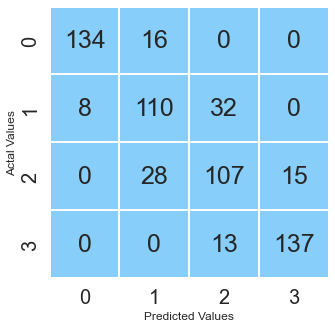

In [106]:
plot_confusion_matrix(gn_model)

In [107]:
print("Classification Report")
test_report = get_test_report(gn_model)

print(test_report)

Classification Report
              precision    recall  f1-score   support

           0       0.94      0.89      0.92       150
           1       0.71      0.73      0.72       150
           2       0.70      0.71      0.71       150
           3       0.90      0.91      0.91       150

    accuracy                           0.81       600
   macro avg       0.82      0.81      0.81       600
weighted avg       0.82      0.81      0.81       600



In [108]:
result1 = pd.DataFrame([['Naive Bayes Classifier', acc_gn]], columns = ['Model', 'Accuracy'])
result1

,Model,Accuracy
0,Naive Bayes Classifier,0.813333


In [109]:
result = result.append(result1, ignore_index=True)
result

,Model,Accuracy
0,Logistic Regression,0.720000
1,Decision Tree Classifier,0.853333
2,Random Forest Classifier,0.900000
3,KNN Classifier,0.941667
4,SVM Classifier,0.938333
5,Naive Bayes Classifier,0.813333


In [110]:
#cross-validation

acc= cross_val_score(estimator=gn, X=x_train, y=y_train, cv=10)
print("Accuracy is {:.2f}%.".format(acc.mean()*100))
print("Standard Deviation is {:.2f}%.".format(acc.std()*100))

Accuracy is 80.86%.
Standard Deviation is 2.30%.


## Comparison of Algorithm Accuracies

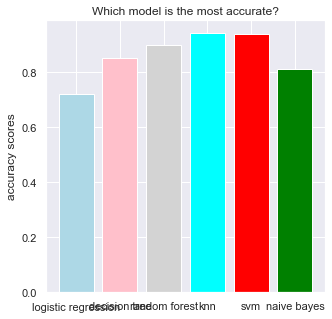

In [111]:
models = ['logistic regression', 'decision tree', 'random forest', 'knn', 'svm', 'naive bayes']
acc_scores = [acc_lr, acc_dt, acc_rf, acc_knn, acc_svm, acc_gn]

plt.bar(models, acc_scores, color=['lightblue', 'pink', 'lightgrey', 'cyan', 'red', 'green'])
plt.ylabel("accuracy scores")
plt.title("Which model is the most accurate?")
plt.show()

## Predict for test data

In [112]:
df_test = pd.read_csv('D:\Project Ekeeda/testdata.csv')

In [113]:
df_test.head()

,id,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,...,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi
0,1,1043,1,1.8,1,14,0,5,0.1,193,...,16,226,1412,3476,12,7,2,0,1,0
1,2,841,1,0.5,1,4,1,61,0.8,191,...,12,746,857,3895,6,0,7,1,0,0
2,3,1807,1,2.8,0,1,0,27,0.9,186,...,4,1270,1366,2396,17,10,10,0,1,1
3,4,1546,0,0.5,1,18,1,25,0.5,96,...,20,295,1752,3893,10,0,7,1,1,0
4,5,1434,0,1.4,0,11,1,49,0.5,108,...,18,749,810,1773,15,8,7,1,0,1


df_test have a columns more than train dataframe that is id columns, so we have to remove that

In [114]:
df_test = df_test.drop('id' , axis=1)

In [115]:
predicted_price_range = knn.predict(df_test) 

In [116]:
predicted_price_range

array([3, 3, 3, 3, 1, 3, 3, 1, 3, 0, 3, 3, 0, 0, 2, 0, 2, 1, 3, 2, 1, 3,
       1, 1, 3, 0, 2, 0, 3, 0, 2, 0, 3, 0, 1, 1, 3, 1, 2, 1, 1, 2, 0, 0,
       0, 1, 0, 3, 1, 2, 1, 0, 3, 0, 3, 1, 3, 1, 1, 3, 3, 2, 0, 2, 1, 1,
       2, 3, 1, 2, 1, 2, 2, 3, 3, 0, 2, 0, 2, 3, 0, 3, 3, 0, 3, 0, 3, 1,
       2, 0, 1, 2, 2, 1, 2, 2, 0, 2, 1, 2, 1, 0, 0, 3, 0, 2, 0, 1, 2, 3,
       3, 3, 1, 3, 3, 3, 3, 1, 3, 0, 0, 3, 2, 1, 2, 0, 3, 2, 3, 1, 0, 2,
       2, 1, 3, 1, 1, 0, 3, 2, 1, 2, 1, 3, 2, 3, 3, 2, 2, 3, 2, 3, 1, 0,
       3, 2, 3, 3, 3, 3, 2, 2, 3, 3, 3, 3, 1, 0, 3, 0, 0, 0, 2, 1, 0, 1,
       0, 0, 1, 2, 1, 0, 0, 1, 1, 2, 2, 1, 0, 0, 0, 1, 0, 3, 1, 0, 2, 2,
       3, 3, 1, 2, 3, 2, 3, 2, 2, 1, 1, 0, 1, 3, 0, 2, 3, 3, 0, 2, 0, 3,
       2, 3, 3, 1, 0, 1, 0, 3, 0, 1, 0, 2, 2, 1, 2, 0, 3, 0, 3, 1, 2, 0,
       0, 2, 1, 3, 3, 3, 1, 1, 3, 0, 0, 2, 3, 3, 1, 3, 1, 1, 3, 2, 1, 2,
       3, 3, 3, 1, 0, 0, 2, 3, 1, 1, 3, 2, 1, 3, 0, 0, 2, 0, 0, 3, 2, 3,
       3, 2, 1, 3, 3, 2, 3, 1, 2, 1, 2, 0, 2, 3, 1,

In [117]:
df_test['price_range'] = predicted_price_range

In [118]:
df_test.head()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,1043,1,1.8,1,14,0,5,0.1,193,3,...,226,1412,3476,12,7,2,0,1,0,3
1,841,1,0.5,1,4,1,61,0.8,191,5,...,746,857,3895,6,0,7,1,0,0,3
2,1807,1,2.8,0,1,0,27,0.9,186,3,...,1270,1366,2396,17,10,10,0,1,1,3
3,1546,0,0.5,1,18,1,25,0.5,96,8,...,295,1752,3893,10,0,7,1,1,0,3
4,1434,0,1.4,0,11,1,49,0.5,108,6,...,749,810,1773,15,8,7,1,0,1,1


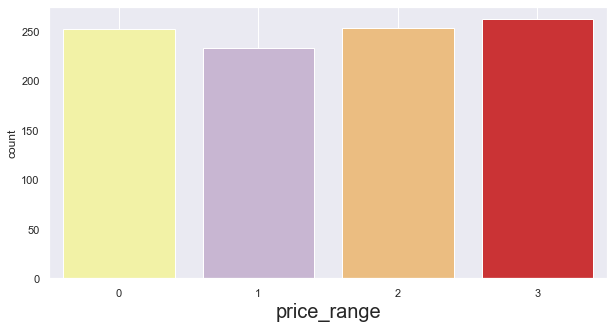

In [119]:
plt.figure(figsize=(10,5))
sns.countplot(x=df_test['price_range'],data=df_test)
plt.xlabel('price_range',fontsize=20)
plt.grid()
plt.show()

We have achieved our goal and predicted price ranges for mobile phones in our new dataset.

## Conclusion

1.  From EDA we can see that here are mobile phones in 4 price ranges. The    number of elements is almost similar. 
2.  half the devices have Bluetooth, and half don’t
3.   there is a gradual increase in battery as the price range increases
4.   Ram has continuous increase with price range while moving from Low cost to Very high cost
5.   costly phones are lighter
6.   RAM, battery power, pixels played more significant role in deciding the price range of mobile phone.